In [1]:
########################################################################

import cv2
# import the necessary packages
from scipy.spatial import distance as dist
from imutils import perspective
from imutils import contours
import numpy as np
import argparse
import imutils
import cv2

from IPython.display import display, Image
from easydict import EasyDict
 
## construct the argument parse and parse the arguments
#ap = argparse.ArgumentParser()
#ap.add_argument("-i", "--image", required=False, help="path to the input image")
#ap.add_argument("-w", "--width", type=float, required=False, help="width of the left-most object in the image (in inches)")
## Do args = vars(ap.parse_args() in Jupyter
#args = EasyDict({
#    "image": 10,
#    "width": 10
#})

########################################################################

In [2]:
### DECLARE GENERAL FUNCTIONS
def midpoint(ptA, ptB):
    return ((ptA[0] + ptB[0]) * 0.5, (ptA[1] + ptB[1]) * 0.5)

In [342]:
def measureImg(imgname_, fineTuning, edgeType, minObjArea, invertPimg, cannyThreshold=[50, 100], binThresh=128):
    ''' <required> imgname_ : 'path + image file name' as a string of the image to analyze
    
        <required> fineTuning : parameter used to adjust the "pixels per metric", the purpose is to
                                tune this value to match the dimensions of the refetence object
        
        <required> edgeType : can be 'edged', 'dilated', or 'eroded' as a string
                              'edged'   : performs the Canny edge detection algorithm
                              'dilated' : performs 'edged' and increases the object area to accentuate
                                          features
                              'eroded'  : performs 'dilated' and erodes away the boundaries of
                                          foreground object to diminish the features of an image
        
        <required> minObjArea : defines the minimum object size to be analyzed, ignore the object if
                                the contour is not sufficiently large
        
        <required> invertPimg : Boolean
                                True  : implements a binary version of the original image before the
                                        detection algorithm
                                False : implements a grey-scale version of the original image before
                                        the detection algorithm
        
        <optional> cannyThreshold=[50, 100] : only useful if invertPimg=False [minVal, maxVal]
                                              any edges with intensity gradient more than maxVal are
                                              sure to be edges and those below minVal are sure to be
                                              non-edges, so discarded.
        
        <optional> binThresh=128 : only useful if invertPimg=True
                                   defines a threshold when creating a binary image, 128 is the middle
                                   of black and white in grey scale '''
    
    #TUNE fineTuning TO MATCH THE REFERENCE OBJECT

    ### IMAGE PRE-PROCESSING
    # load the image
    img = cv2.imread(imgname_)

    # Convert to grayscale
    grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # define a threshold, 128 is the middle of black and white in grey scale
    thresh = binThresh #256/2

    # assign blue channel to zeros
    binary = cv2.threshold(grey, thresh, 256, cv2.THRESH_BINARY)[1]

    # Inverting the colors
    invert = abs(255 - binary)
    
    ### IMAGE PROCESSING
    # perform edge detection, then perform a dilation + erosion to
    
    # close gaps in between object edges
    if invertPimg == False:
        edged = cv2.Canny(grey, cannyThreshold[0], cannyThreshold[1])
    else:
        edged = cv2.Canny(binary, cannyThreshold[0], cannyThreshold[1])

    dilated = cv2.dilate(edged, None, iterations=1)
    eroded = cv2.erode(dilated, None, iterations=1)

    if edgeType == "dilated":
        Pimg = dilated
    elif edgeType == "eroded":
        Pimg = eroded
    else:
        Pimg = edged
    
    # Show and save image
    print()
    print('Image to Process:')
    imgname='./img_out.png'
    cv2.imwrite(imgname,Pimg)
    display(Image(filename=imgname))
    
    ### GET IMAGE MEASUREMENTS
    # find contours in the edge map
    cnts = cv2.findContours(Pimg.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)

    # sort the contours from left-to-right and initialize the
    # 'pixels per metric' calibration variable
    (cnts, _) = contours.sort_contours(cnts)
    pixelsPerMetric = None

    # loop over the contours individually
    i = 0
    for c in cnts:
        # if the contour is not sufficiently large, ignore it
        if cv2.contourArea(c) < minObjArea:
            continue

        # compute the rotated bounding box of the contour
        orig = img.copy()
        box = cv2.minAreaRect(c)
        box = cv2.cv.BoxPoints(box) if imutils.is_cv2() else cv2.boxPoints(box)
        box = np.array(box, dtype="int")

        # order the points in the contour such that they appear
        # in top-left, top-right, bottom-right, and bottom-left
        # order, then draw the outline of the rotated bounding
        # box
        box = perspective.order_points(box)
        cv2.drawContours(orig, [box.astype("int")], -1, (0, 255, 0), 1)

        # loop over the original points and draw them
        for (x, y) in box:
            cv2.circle(orig, (int(x), int(y)), 2, (0, 0, 255), -1)

        # unpack the ordered bounding box, then compute the midpoint
        # between the top-left and top-right coordinates, followed by
        # the midpoint between bottom-left and bottom-right coordinates
        (tl, tr, br, bl) = box
        (tltrX, tltrY) = midpoint(tl, tr)
        (blbrX, blbrY) = midpoint(bl, br)

        # compute the midpoint between the top-left and top-right points,
        # followed by the midpoint between the top-righ and bottom-right
        (tlblX, tlblY) = midpoint(tl, bl)
        (trbrX, trbrY) = midpoint(tr, br)

        # draw the midpoints on the image
        cv2.circle(orig, (int(tltrX), int(tltrY)), 2, (255, 0, 0), -1)
        cv2.circle(orig, (int(blbrX), int(blbrY)), 2, (255, 0, 0), -1)
        cv2.circle(orig, (int(tlblX), int(tlblY)), 2, (255, 0, 0), -1)
        cv2.circle(orig, (int(trbrX), int(trbrY)), 2, (255, 0, 0), -1)

        # draw lines between the midpoints
        cv2.line(orig, (int(tltrX), int(tltrY)), (int(blbrX), int(blbrY)), (255, 0, 255), 1)
        cv2.line(orig, (int(tlblX), int(tlblY)), (int(trbrX), int(trbrY)), (255, 0, 255), 1)

        # compute the Euclidean distance between the midpoints
        dA = dist.euclidean((tltrX, tltrY), (blbrX, blbrY))
        dB = dist.euclidean((tlblX, tlblY), (trbrX, trbrY))

        # if the pixels per metric has not been initialized, then
        # compute it as the ratio of pixels to supplied metric
        # (in this case, inches)
        if pixelsPerMetric is None:
            pixelsPerMetric = dB / fineTuning

        # compute the size of the object
        dimA = dA / pixelsPerMetric
        dimB = dB / pixelsPerMetric

        # convert inches to nm
        dimA = dimA*25400000
        dimB = dimB*25400000
        
        # draw the object sizes on the image
        txtcolor=(255, 171, 0)
        cv2.putText(orig, "{:.2f}nm".format(dimB),
                    (int(tltrX - 15), int(tltrY - 10)), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, txtcolor, 2, 5)
        cv2.putText(orig, "{:.2f}nm".format(dimA),
                    (int(trbrX + 10), int(trbrY)), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, txtcolor, 2)

        # Show and save output image
        print()
        print('Measurements in progress ... ' + str(i))
        print('dimX=' + str(round(dimB,2)) + 'nm;  dimY=' + str(round(dimA,2)) + 'nm;')
        imgname='./img/img_out.png'
        cv2.imwrite(imgname,orig)
        display(Image(filename=imgname))
        i += 1

Help on function measureImg in module __main__:

measureImg(imgname_, fineTuning, edgeType, minObjArea, invertPimg, cannyThreshold=[50, 100], binThresh=128)
    <required> imgname_ : 'path + image file name' as a string of the image to analyze
    
    <required> fineTuning : parameter used to adjust the "pixels per metric", the purpose is to
                            tune this value to match the dimensions of the refetence object
    
    <required> edgeType : can be 'edged', 'dilated', or 'eroded' as a string
                          'edged'   : performs the Canny edge detection algorithm
                          'dilated' : performs 'edged' and increases the object area to accentuate
                                      features
                          'eroded'  : performs 'dilated' and erodes away the boundaries of
                                      foreground object to diminish the features of an image
    
    <required> minObjArea : defines the minimum object size to b

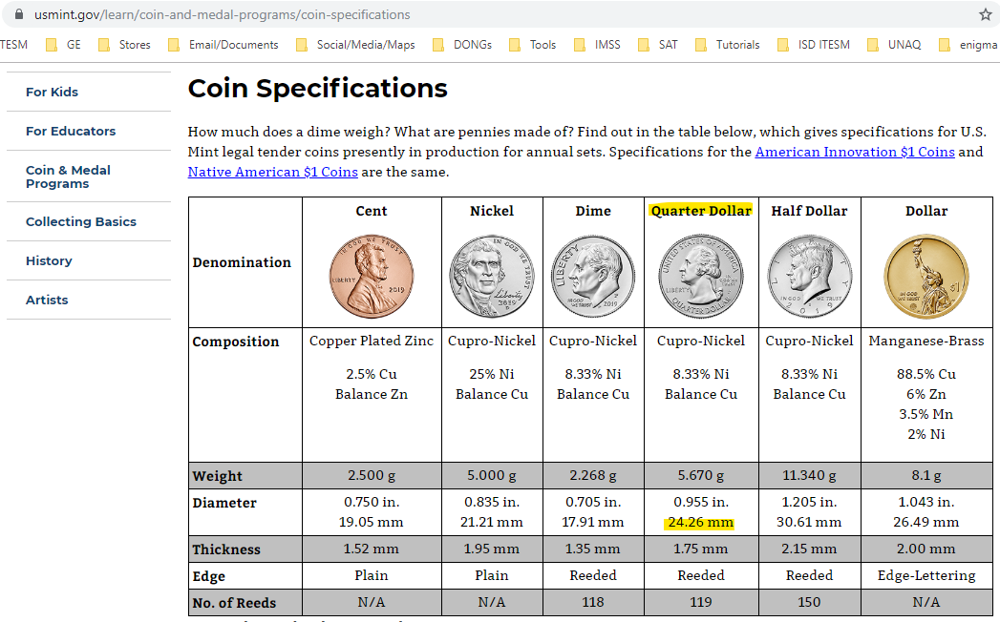


Image to Process:


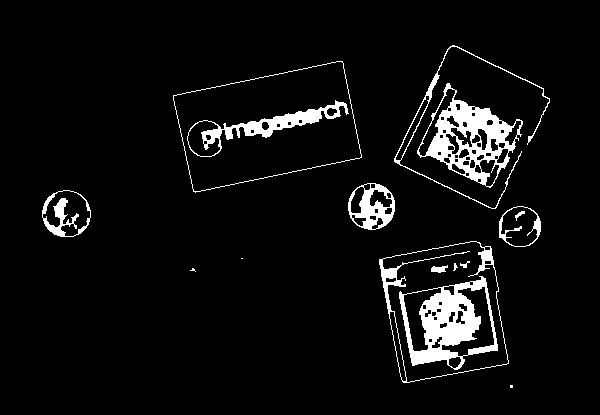


Measurements in progress ... 0
dimX=25314782.61nm;  dimY=24260000.0nm;


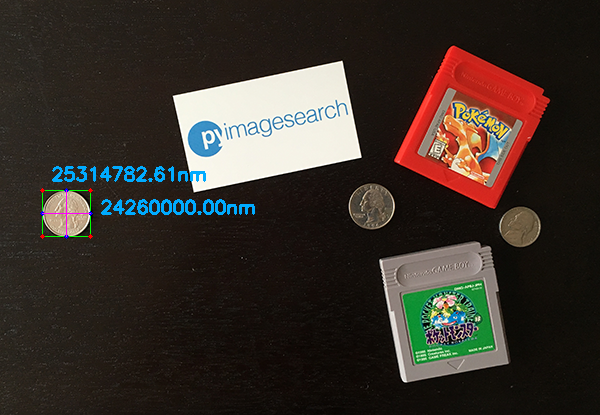


Measurements in progress ... 1
dimX=91795255.54nm;  dimY=52803037.9nm;


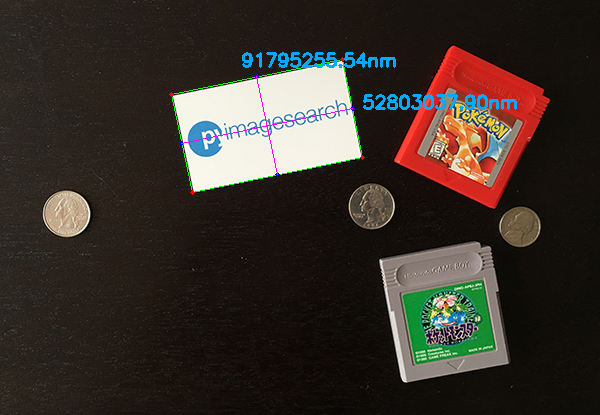


Measurements in progress ... 2
dimX=24260000.0nm;  dimY=24260000.0nm;


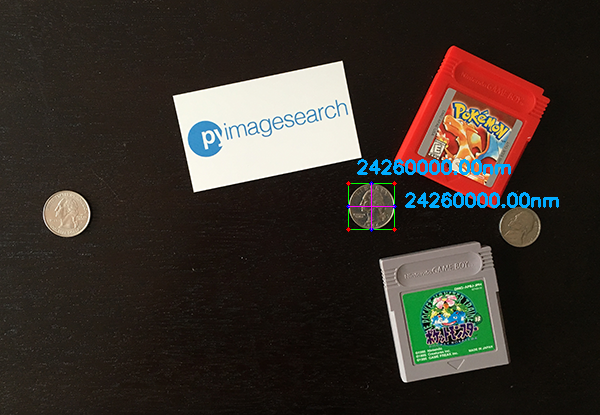


Measurements in progress ... 3
dimX=60097158.99nm;  dimY=67030584.14nm;


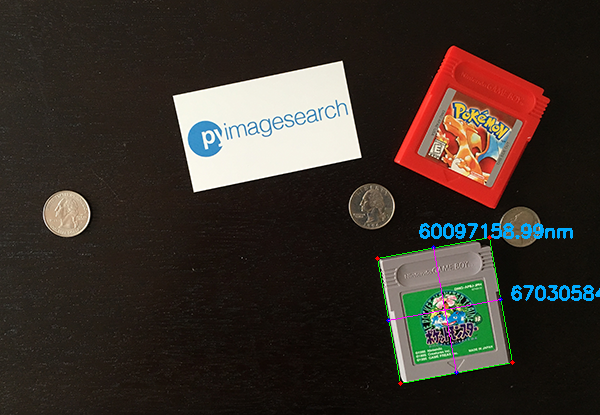


Measurements in progress ... 4
dimX=60383425.5nm;  dimY=69817127.75nm;


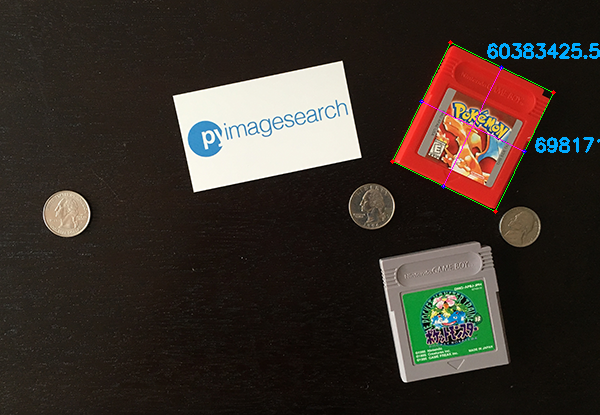


Measurements in progress ... 5
dimX=47412448.92nm;  dimY=41993066.89nm;


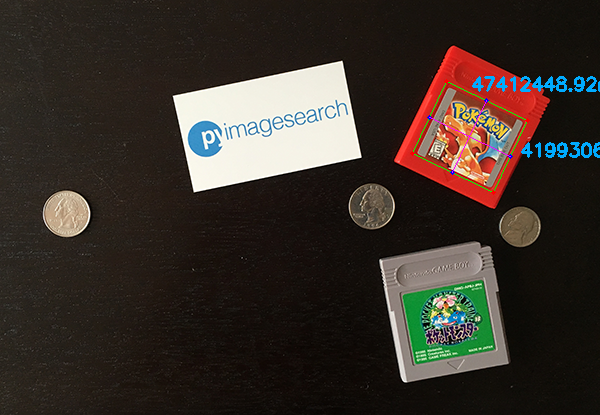


Measurements in progress ... 6
dimX=21623043.48nm;  dimY=21095652.17nm;


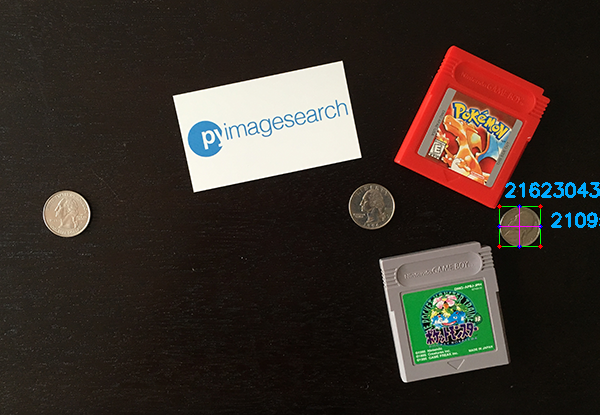

In [396]:
help(measureImg)
display(Image(filename='./img/UScoinRef.png'))
measureImg('./img/example_01.png', 0.9966449845, 'eroded', 100, False, cannyThreshold=[40, 250])


Image to Process:


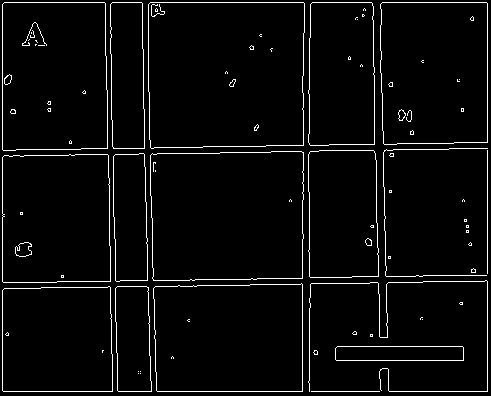


Measurements in progress ... 0
dimX=851562.5nm;  dimY=820312.5nm;


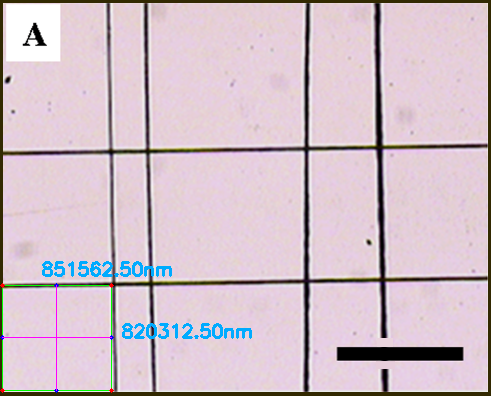


Measurements in progress ... 1
dimX=843750.0nm;  dimY=1000000.0nm;


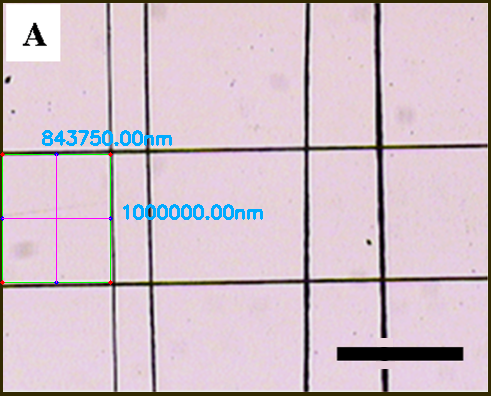


Measurements in progress ... 2
dimX=820312.5nm;  dimY=1156250.0nm;


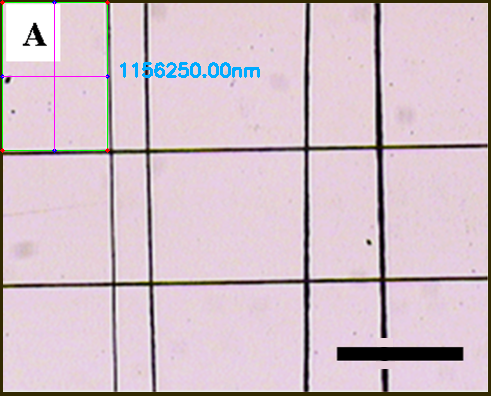


Measurements in progress ... 3
dimX=257930.84nm;  dimY=1140732.01nm;


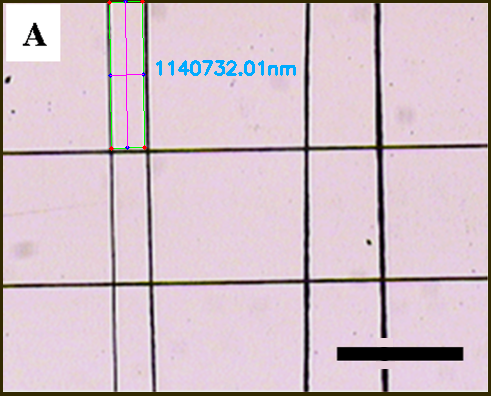


Measurements in progress ... 4
dimX=261835.33nm;  dimY=1000373.77nm;


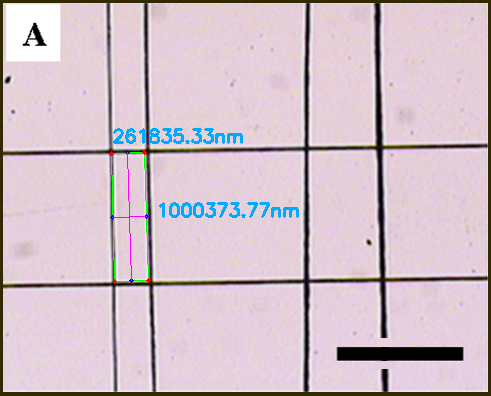


Measurements in progress ... 5
dimX=269644.45nm;  dimY=820768.1nm;


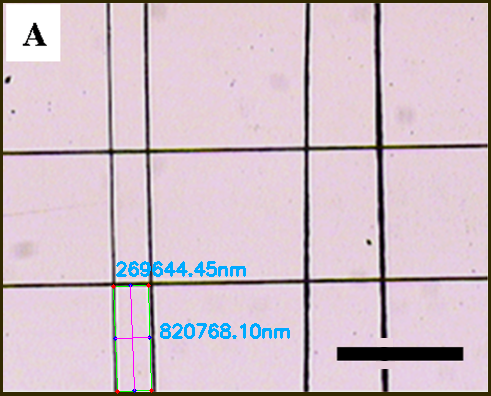


Measurements in progress ... 6
dimX=1218750.0nm;  dimY=1140625.0nm;


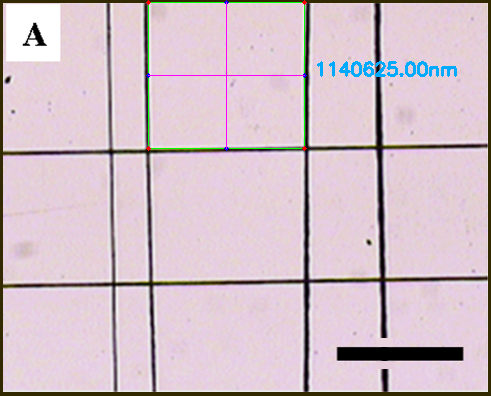


Measurements in progress ... 7
dimX=1199320.53nm;  dimY=1000190.71nm;


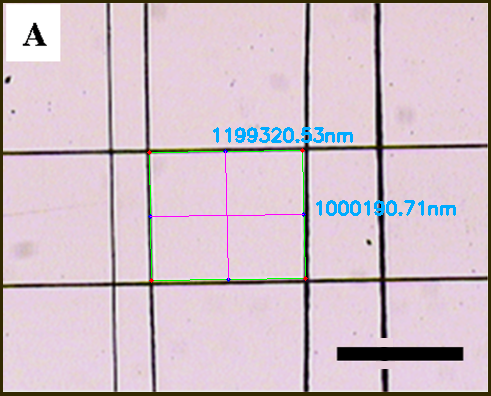


Measurements in progress ... 8
dimX=1164062.5nm;  dimY=843750.0nm;


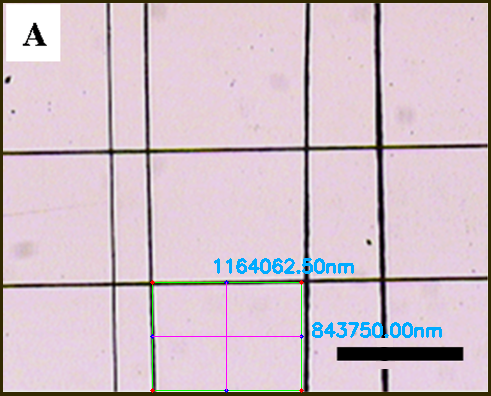


Measurements in progress ... 9
dimX=546875.0nm;  dimY=992187.5nm;


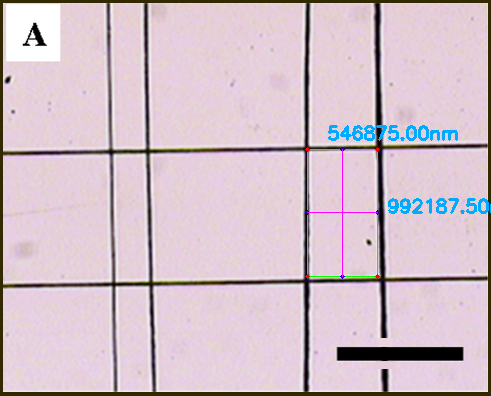


Measurements in progress ... 10
dimX=515625.0nm;  dimY=1117187.5nm;


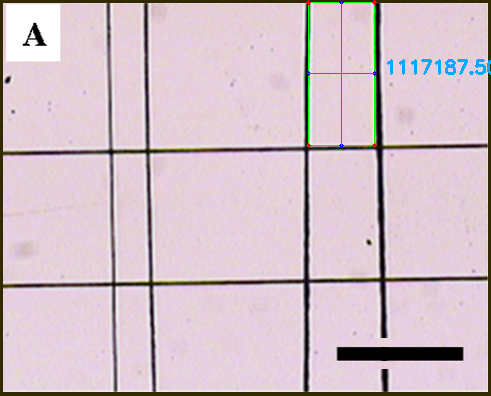


Measurements in progress ... 11
dimX=1000000.0nm;  dimY=109375.0nm;


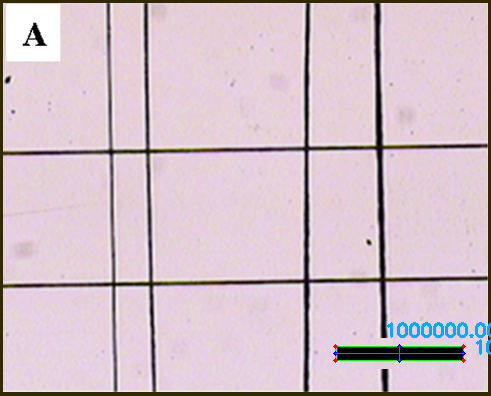


Measurements in progress ... 12
dimX=835937.5nm;  dimY=1109375.0nm;


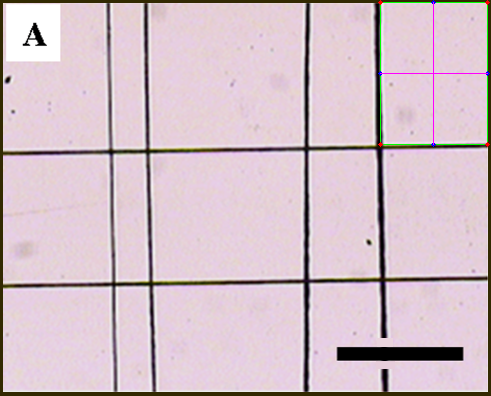

In [344]:
measureImg('./img/F4a_Lei2015.png', 0.0335260826, 'canny', 250, True, binThresh=200)


Image to Process:


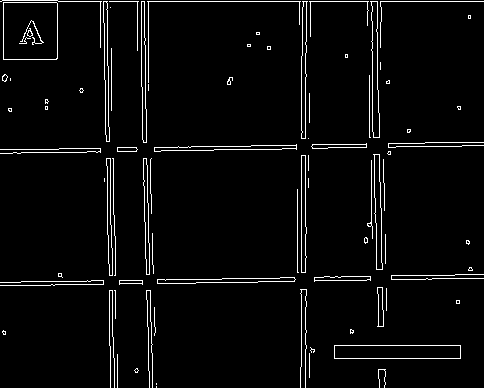


Measurements in progress ... 0
dimX=420634.92nm;  dimY=444444.45nm;


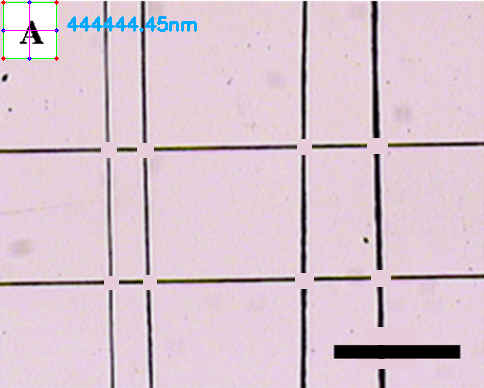


Measurements in progress ... 1
dimX=36585.49nm;  dimY=1111288.25nm;


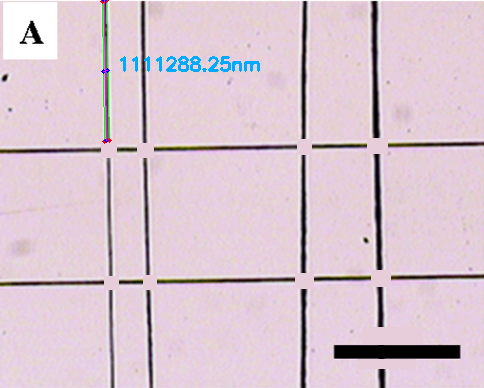


Measurements in progress ... 2
dimX=36585.49nm;  dimY=928783.39nm;


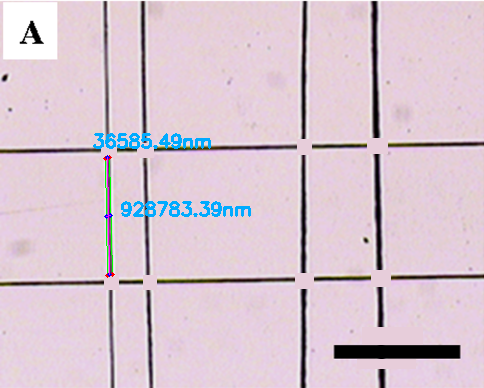


Measurements in progress ... 3
dimX=40468.41nm;  dimY=1119160.19nm;


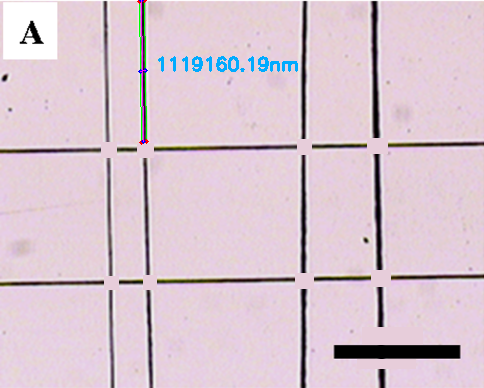


Measurements in progress ... 4
dimX=32723.06nm;  dimY=920942.75nm;


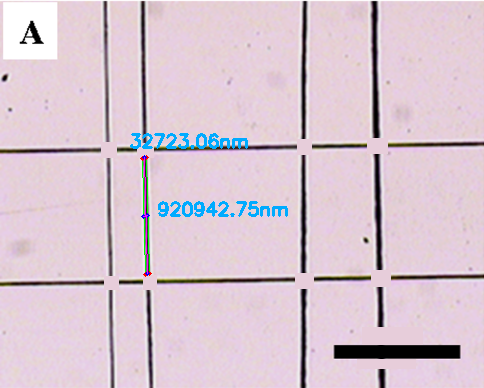


Measurements in progress ... 5
dimX=1131126.42nm;  dimY=35934.07nm;


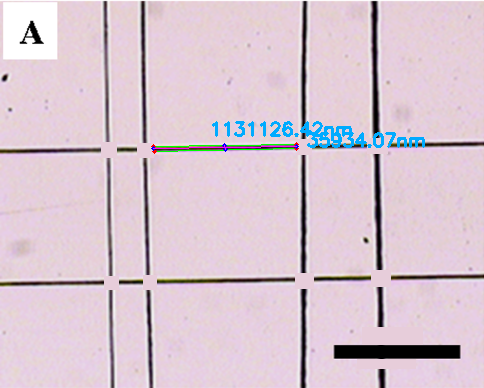


Measurements in progress ... 6
dimX=1095417.81nm;  dimY=36585.49nm;


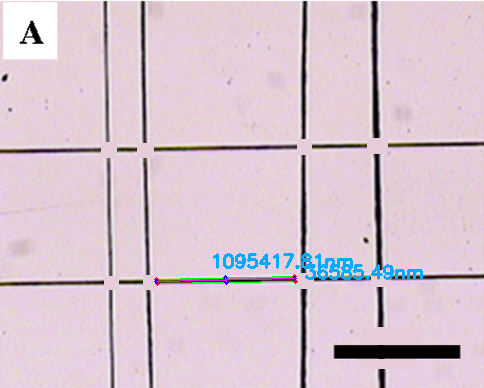


Measurements in progress ... 7
dimX=39682.54nm;  dimY=928571.43nm;


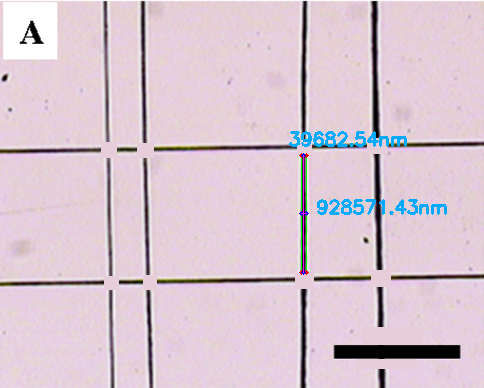


Measurements in progress ... 8
dimX=48275.89nm;  dimY=1087417.45nm;


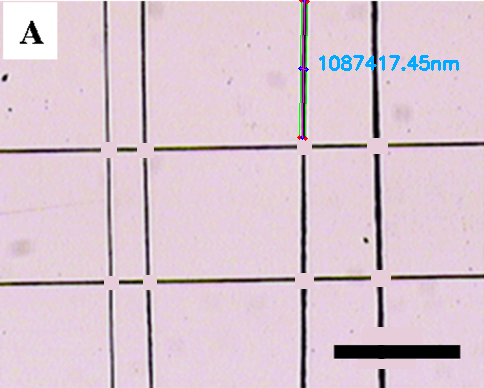


Measurements in progress ... 9
dimX=1000000.0nm;  dimY=103174.6nm;


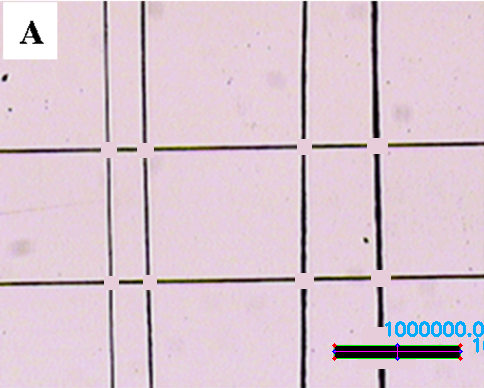


Measurements in progress ... 10
dimX=55697.1nm;  dimY=1083449.62nm;


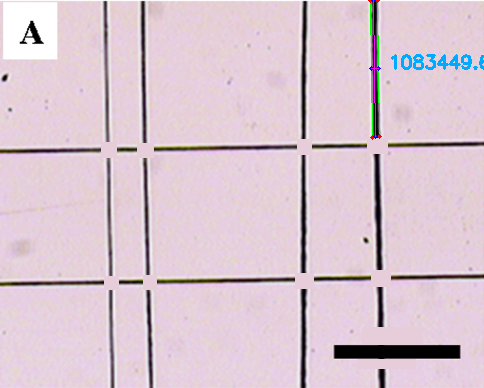


Measurements in progress ... 11
dimX=60050.58nm;  dimY=912914.06nm;


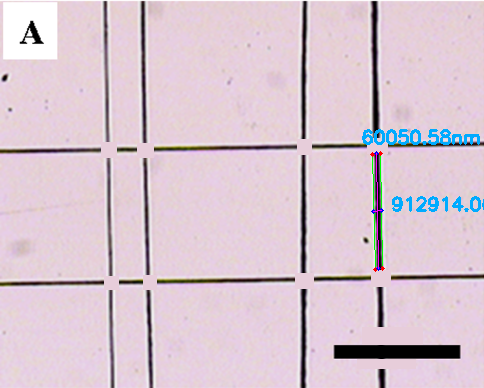

In [345]:
measureImg('./img/F4a_nc_Lei2015.png', 0.01656043, 'canny', 250, False, cannyThreshold=[50, 100])


Image to Process:


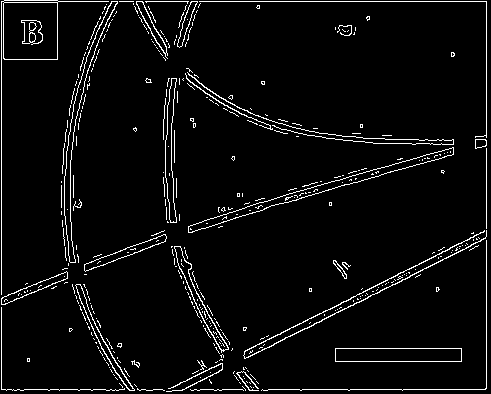


Measurements in progress ... 0
dimX=579976.3nm;  dimY=66520.06nm;


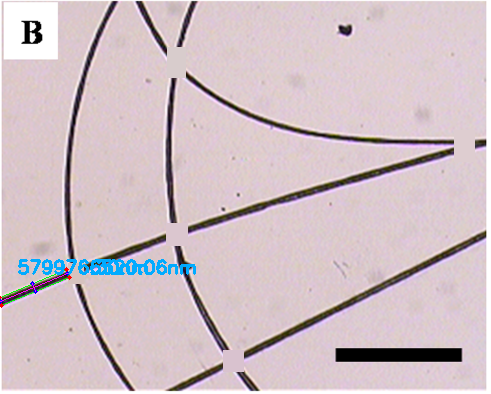


Measurements in progress ... 1
dimX=2475605.33nm;  dimY=793333.27nm;


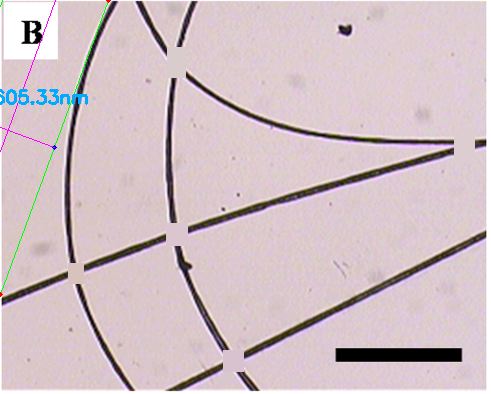


Measurements in progress ... 2
dimX=2099352.61nm;  dimY=216624.51nm;


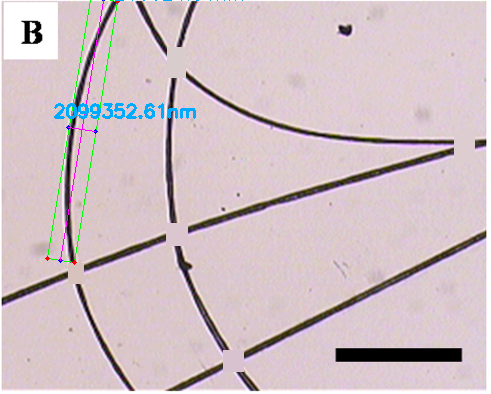


Measurements in progress ... 3
dimX=954824.9nm;  dimY=88732.86nm;


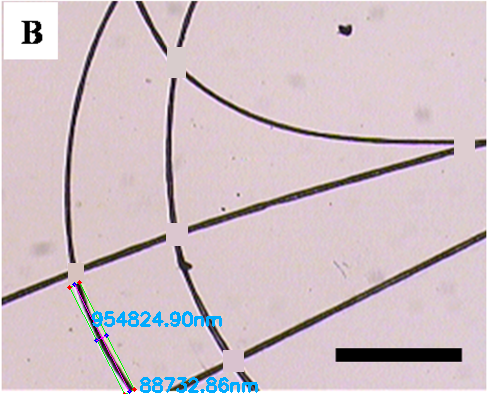


Measurements in progress ... 4
dimX=704574.64nm;  dimY=64109.1nm;


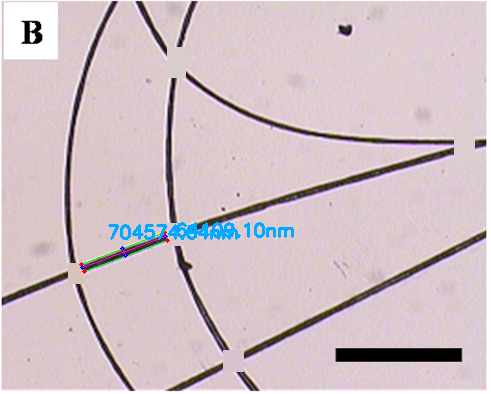


Measurements in progress ... 5
dimX=511212.15nm;  dimY=60442.64nm;


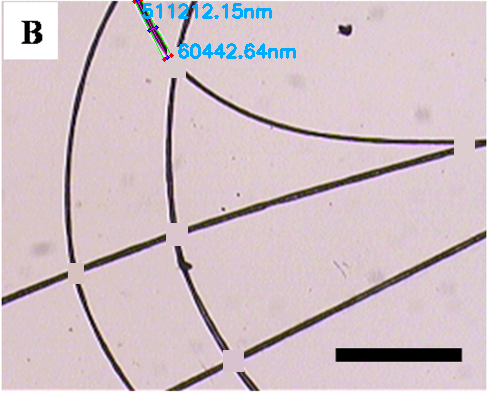


Measurements in progress ... 6
dimX=87301.59nm;  dimY=1142857.14nm;


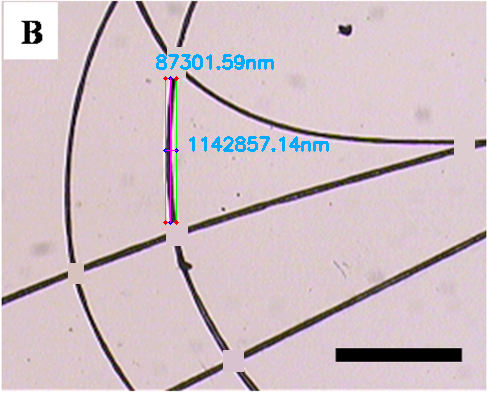


Measurements in progress ... 7
dimX=923504.01nm;  dimY=103174.6nm;


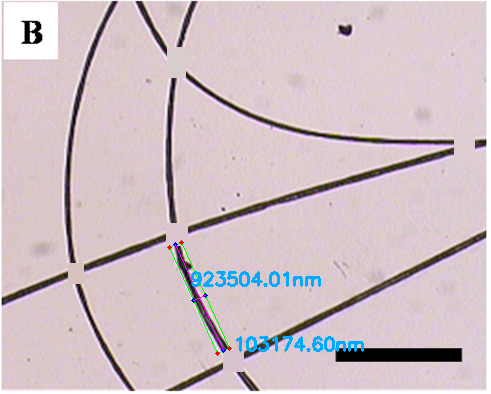


Measurements in progress ... 8
dimX=386533.19nm;  dimY=57778.65nm;


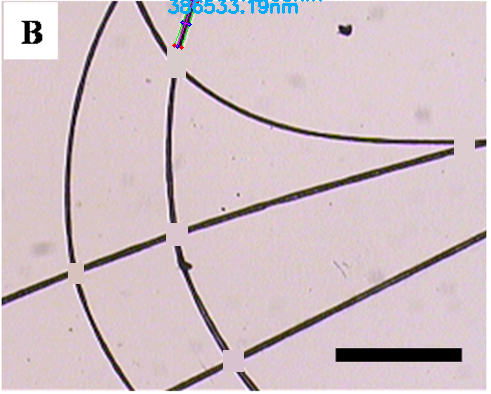


Measurements in progress ... 9
dimX=2210987.04nm;  dimY=79066.9nm;


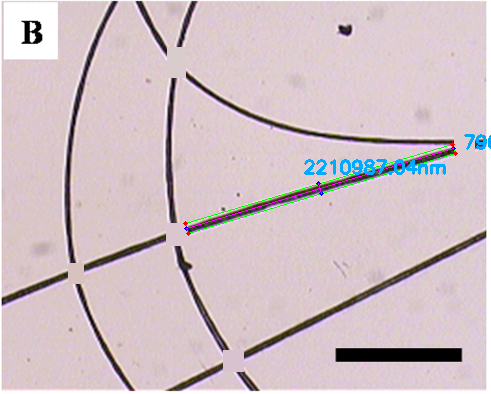


Measurements in progress ... 10
dimX=2173954.97nm;  dimY=67460.32nm;


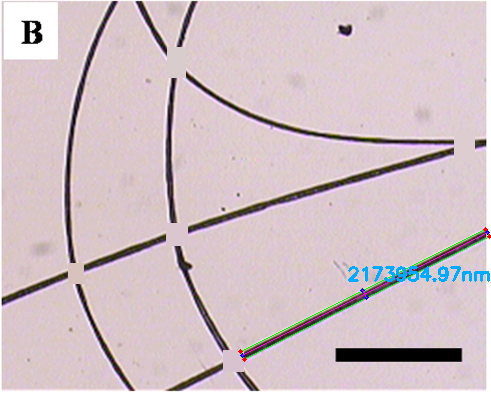


Measurements in progress ... 11
dimX=1000000.0nm;  dimY=103174.6nm;


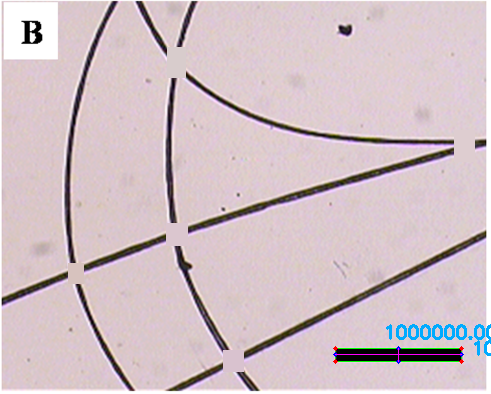

In [328]:
measureImg('./img/F4b_nc_Lei2015.png', 0.0228337126, 'canny', 150, False, cannyThreshold=[50, 100])